In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
d = '../src/scripts'

import sys
if not d in sys.path:
    sys.path.append(d)

In [3]:
import arviz as az
import astropy.cosmology as cosmo
from astropy.cosmology import Planck18
import astropy.units as u
import dataclasses
from dataclasses import dataclass
from glob import glob
import h5py
import intensity_models
from intensity_models import make_pop_model, make_pop_cosmo_model
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor
import pytensor.tensor as pt
import re
import scipy.stats as ss
import seaborn as sns
import time
from tqdm.notebook import tqdm
from utils import pt_interp, pt_cumtrapz
import weighting

sns.set_theme('notebook', 'ticks', 'colorblind')

These numbers are pretty close to the mean of each parameter from O3a.

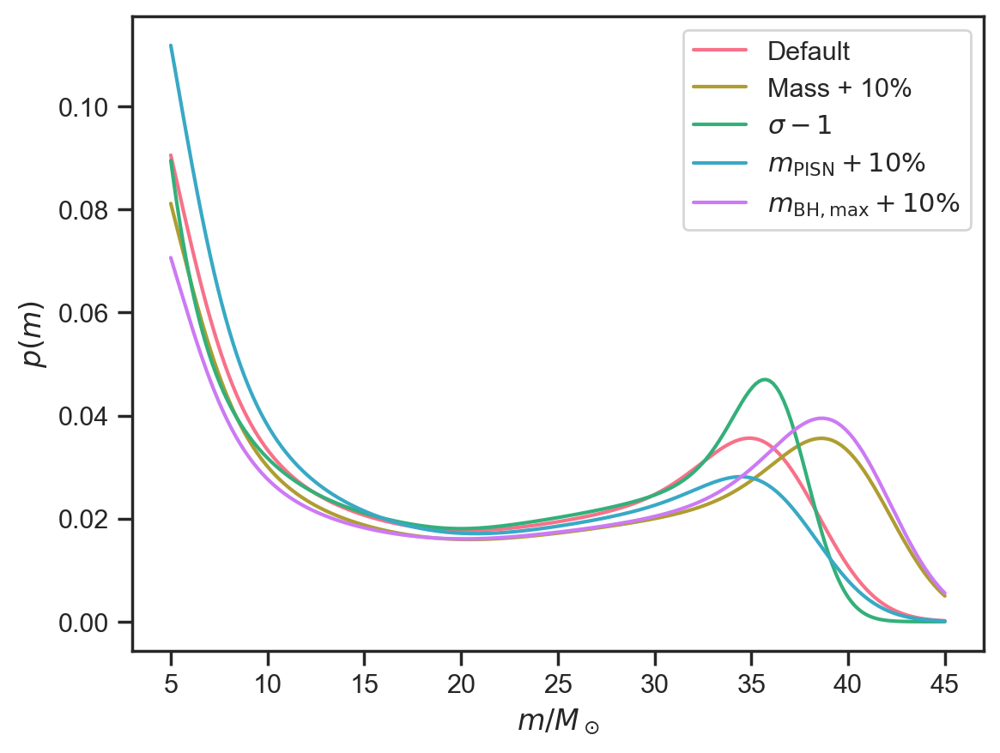

In [4]:
a, b, mpisn, mbhmax, sigma = weighting.a, weighting.b, weighting.mpisn, weighting.mbhmax, weighting.sigma

with sns.color_palette('husl', n_colors=5):
    m = np.linspace(5, 45, 1024)
    def plot_mass_model(dndm, label=None):
        dndm = dndm / np.trapz(dndm, m)
        plt.plot(m, dndm, label=label)
    plot_mass_model(np.exp(intensity_models.LogDNDMPISN(a, b, mpisn, mbhmax, sigma)(m).eval()), label='Default')
    plot_mass_model(np.exp(intensity_models.LogDNDMPISN(a, b, mpisn*1.1, mbhmax*1.1, sigma)(m).eval()), label='Mass + 10%')
    plot_mass_model(np.exp(intensity_models.LogDNDMPISN(a, b, mpisn, mbhmax, sigma-1)(m).eval()), label=r'$\sigma - 1$')
    plot_mass_model(np.exp(intensity_models.LogDNDMPISN(a, b, mpisn*1.1, mbhmax, sigma)(m).eval()), label=r'$m_\mathrm{PISN} + 10\%$')
    plot_mass_model(np.exp(intensity_models.LogDNDMPISN(a, b, mpisn, mbhmax*1.1, sigma)(m).eval()), label=r'$m_\mathrm{BH,max} + 10\%$')
    plt.legend()
    plt.xlabel(r'$m / M_\odot$')
    plt.ylabel(r'$p(m)$')

In [5]:
gwtc = pd.read_csv('../src/data/GWTC.csv')

In [9]:
x = ['a', 'b']
x.append(['c', 'd'])

In [11]:
nsamp = 1024
fnames = []
m1s = []
qs = []
zs = []
pdraws = []
for f in glob('/Users/wfarr/Research/o3a_posterior_samples/all_posterior_samples/GW[0-9]*[0-9].h5') + glob('/Users/wfarr/Research/o3b_data/PE/IGWN*GW*nocosmo*.h5'):
    gwname = re.match('^.*(GW[0-9_]+[0-9]+).*.h5$', f)[1]

    try:
        evt = gwtc[gwtc.commonName == gwname].iloc[0]
    except IndexError:
        print('skipping {:s} because not found in GWTC table'.format(gwname))
        continue

    if evt.far < 1:
        try:
            m1, q, z, pd = weighting.extract_posterior_samples(f, nsamp, desired_pop_wt=weighting.default_pop_wt)
        except ValueError as err:
            print(f'Could not read {gwname}, exception {err}')
            continue

        if np.median(q*m1) < 5:
            print(f'Skipping {gwname} because median m2 = {np.median(q*m1):0.1f} < 5 MSun')
            continue

        m1s.append(m1)
        qs.append(q)
        zs.append(z)
        pdraws.append(pd)
        fnames.append(f)
    else:
        print('skipping {:s} due to high FAR {:g}'.format(gwname, evt.far))

m1s = np.array(m1s)
qs = np.array(qs)
zs = np.array(zs)
pdraws = np.array(pdraws)

skipping GW190909_114149 due to high FAR 26.183
skipping GW190424_180648 due to high FAR 9.03879
Skipping GW190426_152155 because median m2 = 1.5 < 5 MSun
Skipping GW190814 because median m2 = 2.6 < 5 MSun
skipping GW190514_065416 due to high FAR 2.8
Could not read GW190425
Exception: err=ValueError('could not read samples from /Users/wfarr/Research/o3a_posterior_samples/all_posterior_samples/GW190425.h5 due to too few samples: 87.2')
skipping GW200322_091133 due to high FAR 140
skipping GW191126_115259 due to high FAR 3.2
skipping GW200220_061928 due to high FAR 6.8
skipping GW191219_163120 due to high FAR 4
skipping GW200210_092254 due to high FAR 1.2
skipping GW200105_162426 because not found in GWTC table
skipping GW200220_124850 due to high FAR 30
skipping GW200308_173609 due to high FAR 2.4
Skipping GW200115_042309 because median m2 = 1.5 < 5 MSun
skipping GW191113_071753 due to high FAR 26
skipping GW200208_222617 due to high FAR 4.8
skipping GW200306_093714 due to high FAR 24
s

Text(0, 0.5, '$m_2 / M_\\odot$')

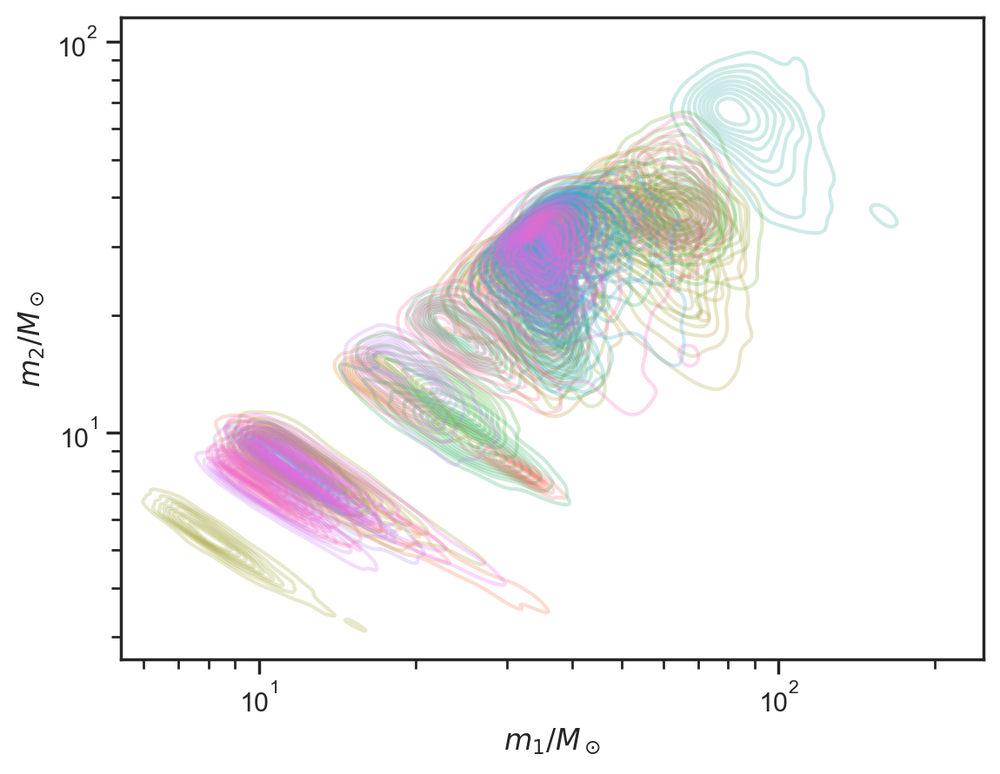

In [13]:
with sns.color_palette('husl', n_colors=m1s.shape[0]):
    for i in range(m1s.shape[0]):
        sns.kdeplot(x=m1s[i,:], y=qs[i,:]*m1s[i,:], log_scale=True, alpha=0.25)
plt.xlabel(r'$m_1 / M_\odot$')
plt.ylabel(r'$m_2 / M_\odot$')

Text(0, 0.5, '$m_1 / M_\\odot$')

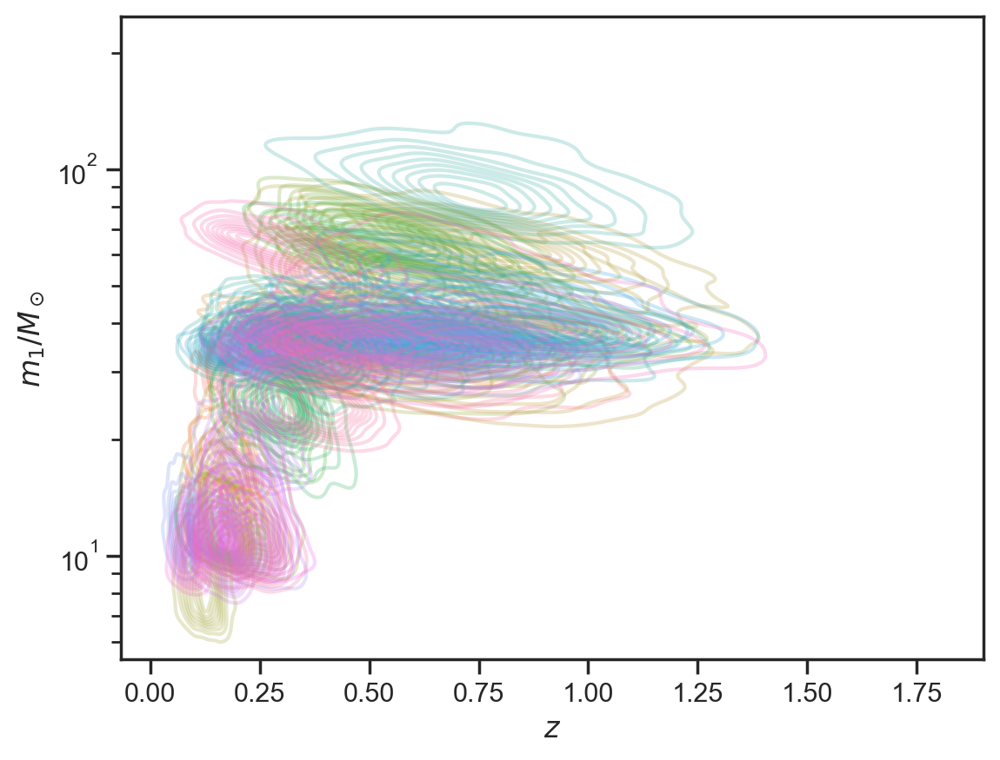

In [14]:
with sns.color_palette('husl', n_colors=m1s.shape[0]):
    for i in range(m1s.shape[0]):
        sns.kdeplot(x=zs[i,:], y=m1s[i,:], log_scale=(False, True), alpha=0.25)
plt.xlabel(r'$z$')
plt.ylabel(r'$m_1 / M_\odot$')

In [46]:
with h5py.File('/Users/wfarr/Research/o3b_data/O3-Sensitivity/endo3_bbhpop-LIGO-T2100113-v12.hdf5', 'r') as f:
    m1s_sel = np.array(f['injections/mass1_source'])
    qs_sel = np.array(f['injections/mass2_source'])/m1s_sel
    zs_sel = np.array(f['injections/redshift'])
    pdraw_sel = np.array(f['injections/mass1_source_mass2_source_sampling_pdf'])*np.array(f['injections/redshift_sampling_pdf'])*m1s_sel

    pycbc_far = np.array(f['injections/far_pycbc_hyperbank'])
    pycbc_bbh_far = np.array(f['injections/far_pycbc_bbh'])
    gstlal_far = np.array(f['injections/far_gstlal'])
    mbta_far = np.array(f['injections/far_mbta'])

    far_threshold = 1 # per year
    detected = (pycbc_far < far_threshold) | (pycbc_bbh_far < far_threshold) | (gstlal_far < far_threshold) | (mbta_far < far_threshold)

    ndraw = f.attrs['n_accepted'] + f.attrs['n_rejected']

    T = (f.attrs['end_time_s'] - f.attrs['start_time_s'])/(3600.0*24.0*365.25) 
    pdraw_sel /= T

    m1s_sel = m1s_sel[detected]
    qs_sel = qs_sel[detected]
    zs_sel = zs_sel[detected]
    pdraw_sel = pdraw_sel[detected]

In [47]:
nsel = 2048

pop_wt = desired_pop_wt(m1s_sel, qs_sel, zs_sel)
unnorm_wt = pop_wt/pdraw_sel
sum_norm_wt = unnorm_wt / np.sum(unnorm_wt)
pdraw_wt = pop_wt / (np.sum(unnorm_wt) / ndraw)

print('Approximately {:.0f} independent samples remain after reweighting'.format(1/np.sum(sum_norm_wt*sum_norm_wt)))

inds = np.random.choice(len(m1s_sel), size=nsel, p=sum_norm_wt)
m1s_sel_cut = m1s_sel[inds]
qs_sel_cut = qs_sel[inds]
zs_sel_cut = zs_sel[inds]
pdraw_sel_cut = pdraw_wt[inds]
ndraw_cut = nsel

Approximately 19106 independent samples remain after reweighting


In [48]:
model = make_pop_model(m1s, qs, zs, pdraws, m1s_sel_cut, qs_sel_cut, zs_sel_cut, pdraw_sel_cut, ndraw_cut)

In [49]:
reload = False

if reload:
    trace = az.from_netcdf('../src/data/trace.nc')
else:
    nmcmc = 1000
    chains = 4
    with tqdm(total=2*nmcmc*chains, smoothing=10/(2*nmcmc*chains)) as bar:
        with model:
            trace = pm.sample(draws=nmcmc, tune=nmcmc, chains=chains, progressbar=False, init='jitter+adapt_full', callback=lambda draw, trace: bar.update(1))

  0%|          | 0/8000 [00:00<?, ?it/s]

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_full...
/Users/wfarr/miniconda3/envs/BumpCosmology/lib/python3.11/site-packages/pymc/step_methods/hmc/quadpotential.py:629: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, b, c, mpisn, dmbhmax, sigma, beta, log_fpl, lam, dkappa, zp, R]
Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1420 seconds.
There were 240 divergences after tuning. Increase `target_accept` or reparameterize.


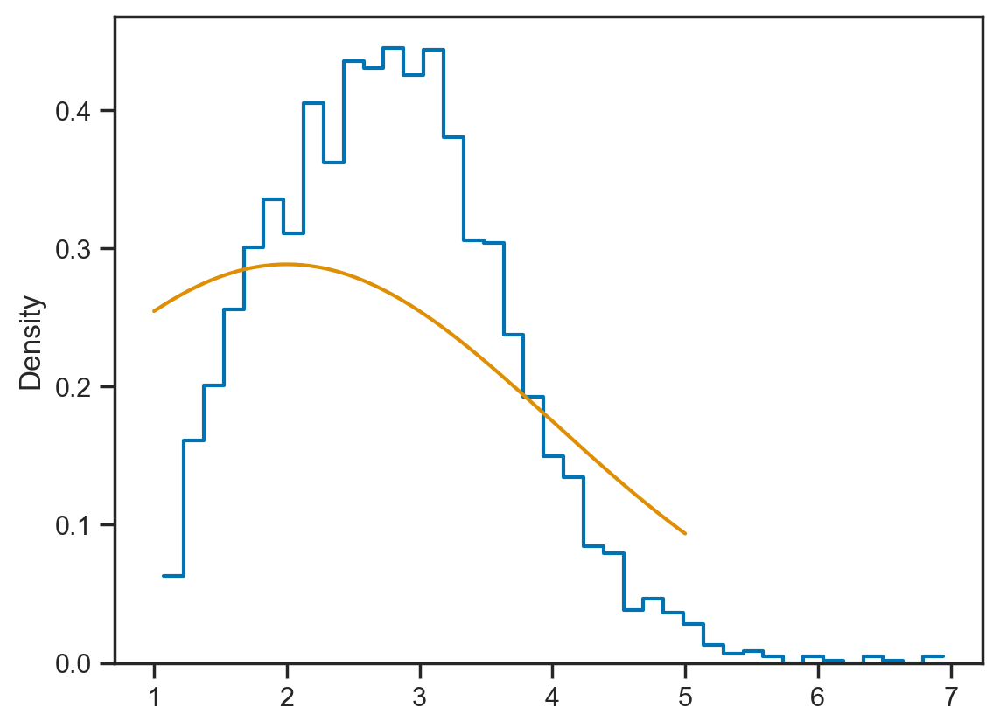

In [50]:
sns.histplot(trace.posterior.sigma.values.flatten(), stat='density', element='step', fill=False)
xs = np.linspace(1, 5, 1024)
d = ss.norm(loc=2, scale=2)
plt.plot(xs, d.pdf(xs)/(1-d.cdf(1)))

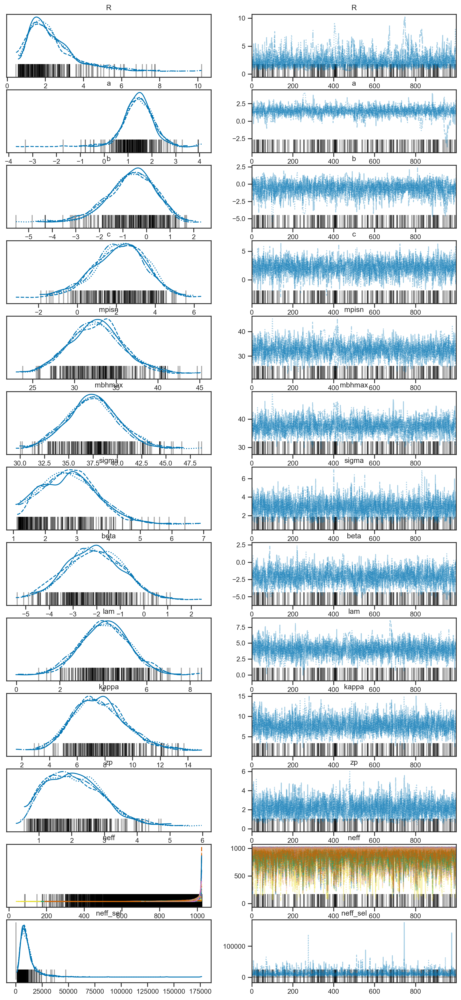

In [51]:
with model:
    az.plot_trace(trace, lines=[('neff_sel', {}, 4*m1s.shape[0])], var_names=['R', 'a', 'b', 'c', 'mpisn', 'mbhmax', 'sigma', 'beta', 'lam', 'kappa', 'zp', 'neff', 'neff_sel'])

In [52]:
if not reload:
    az.to_netcdf(trace, '../src/data/trace.nc')

In [53]:
trace.posterior.neff_sel.min()

<xarray.DataArray 'neff_sel' ()>
array(859.02407015)

In [54]:
trace.posterior.neff.min(dim=['chain','draw'])

<xarray.DataArray 'neff' (obs: 56)>
array([296.18477883, 660.48995084, 758.67287005, 686.00681792,
       408.19446512, 817.80627839, 699.65379481, 465.51075211,
       113.62098039, 260.40664745, 108.81181513, 190.7100699 ,
       663.26280136, 967.8957536 , 246.10707557, 196.6445389 ,
       168.60782971, 221.40339551, 777.3113779 , 730.67274682,
       175.09079067, 679.95968233, 266.95121834, 811.64548375,
       337.18738275, 401.33490384, 320.63787653, 483.47978312,
        36.11452099, 364.68704011, 504.96051577, 334.19190687,
       331.42495774, 298.2923886 , 190.50092477, 402.21627521,
       240.46941743, 271.54579974, 172.02148799, 573.02055387,
       741.63904304, 303.62178938, 701.26394316, 326.21575725,
       717.51493805, 916.95392172, 741.5378152 , 672.14099556,
       498.30371116, 375.34504873, 904.80774984, 403.38902944,
       169.06565201, 188.50540228, 846.23262115, 701.76707451])
Coordinates:
  * obs      (obs) int64 0 1 2 3 4 5 6 7 8 9 ... 46 47 48 49 50 51 52 53 54 55

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{q=1, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

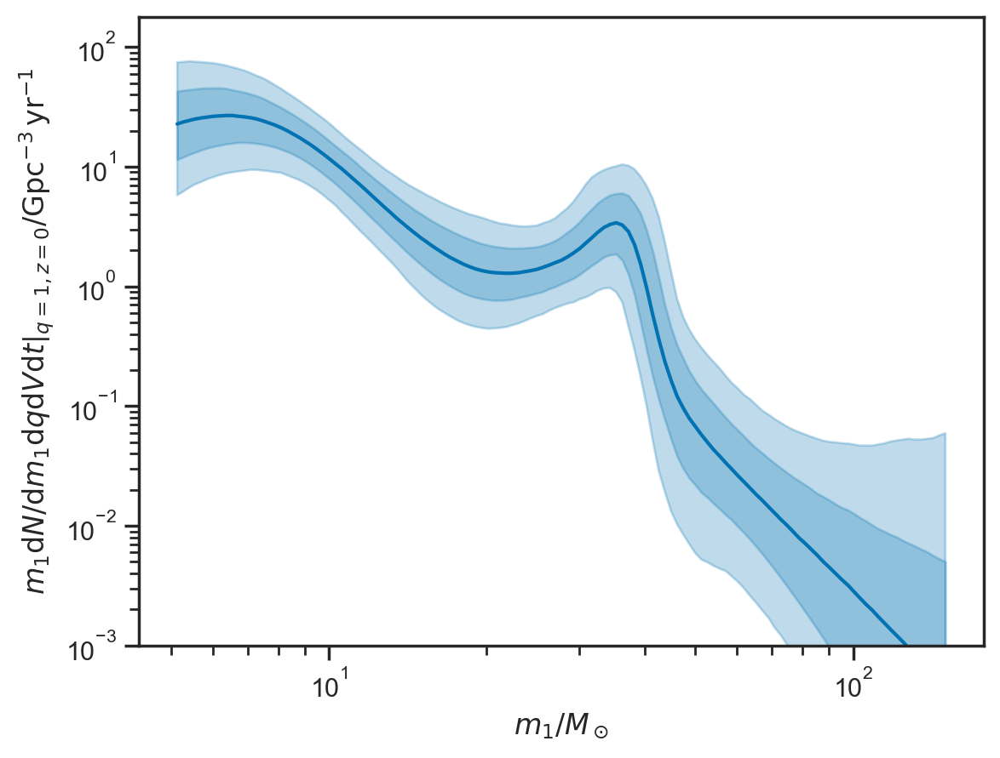

In [55]:
d = ['chain', 'draw']
m = trace.posterior.coords['m_grid']
dN = trace.posterior['mdNdmdVdt_fixed_qz']
l, = plt.plot(m[1:], dN.median(dim=d)[1:])
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(m[1:], dN.quantile(h, dim=d)[1:], dN.quantile(l, dim=d)[1:], color=c, alpha=0.25)
plt.xscale('log')
plt.yscale('log')
plt.ylim(bottom=1e-3)
plt.xlabel(r'$m_1 / M_\odot$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{q=1, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

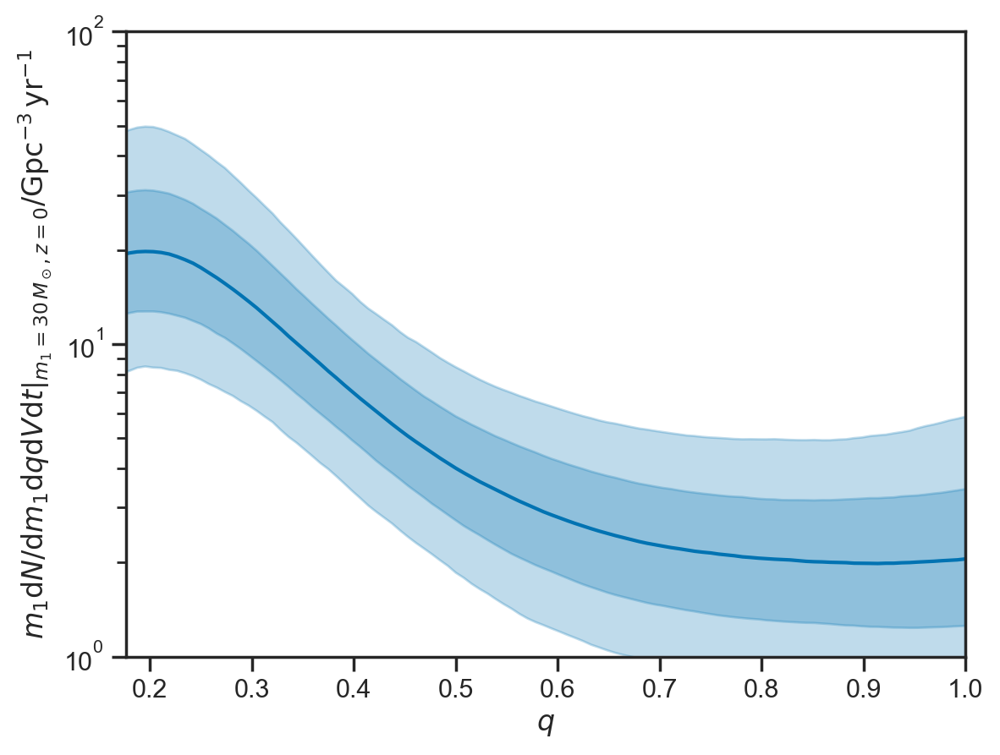

In [56]:
d = ['chain', 'draw']
q = trace.posterior.coords['q_grid']
dN = trace.posterior['dNdqdVdt_fixed_mz']
l, = plt.plot(q, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(q, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.yscale('log')
plt.xlim(left=5/30+0.01, right=1)
plt.ylim(bottom=1, top=1e2)
plt.xlabel(r'$q$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, q=1} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

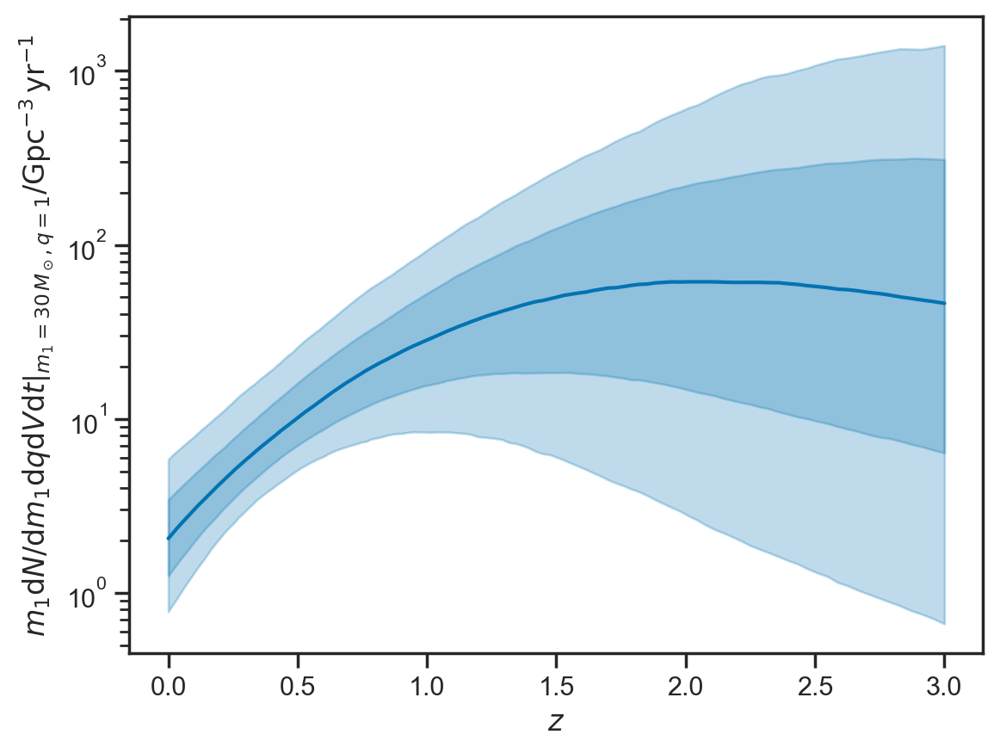

In [57]:
d = ['chain', 'draw']
z = trace.posterior.coords['z_grid']
dN = trace.posterior['dNdVdt_fixed_mq']
l, = plt.plot(z, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(z, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.yscale('log')
plt.xlabel(r'$z$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, q=1} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

array([[<Axes: ylabel='mpisn'>, <Axes: >, <Axes: >],
       [<Axes: ylabel='mbhmax'>, <Axes: >, <Axes: >],
       [<Axes: xlabel='mpisn', ylabel='sigma'>, <Axes: xlabel='mbhmax'>,
        <Axes: xlabel='sigma'>]], dtype=object)

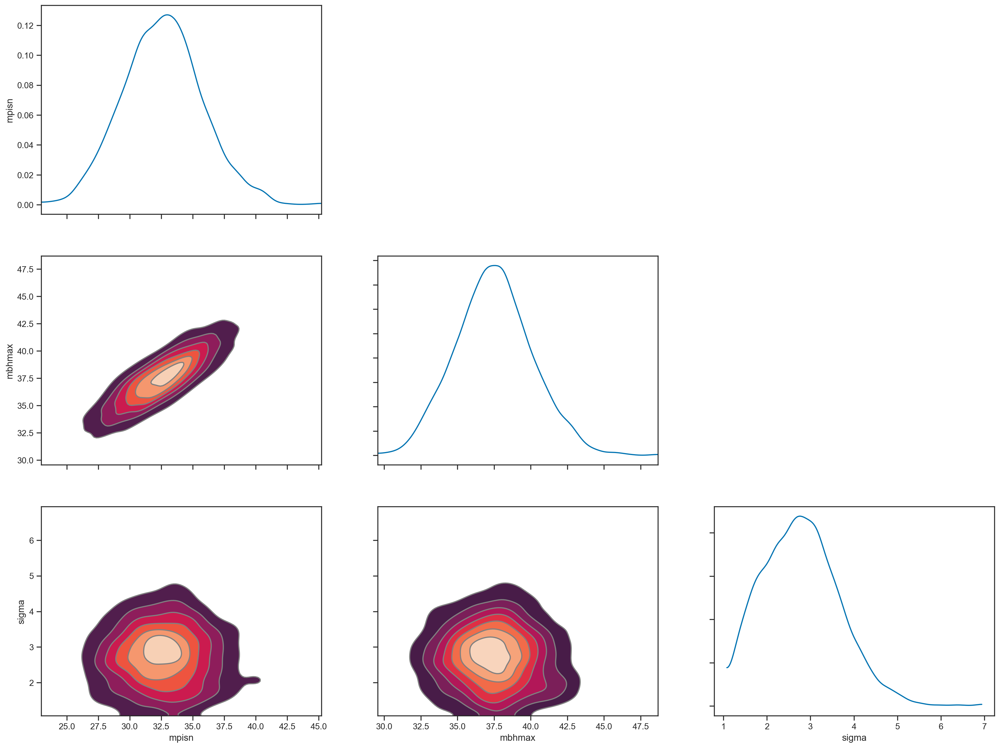

In [58]:
az.plot_pair(trace, var_names=['mpisn', 'mbhmax', 'sigma'], marginals=True, kind='kde')

array([[<Axes: >, None],
       [<Axes: xlabel='fpl', ylabel='c'>, <Axes: >]], dtype=object)

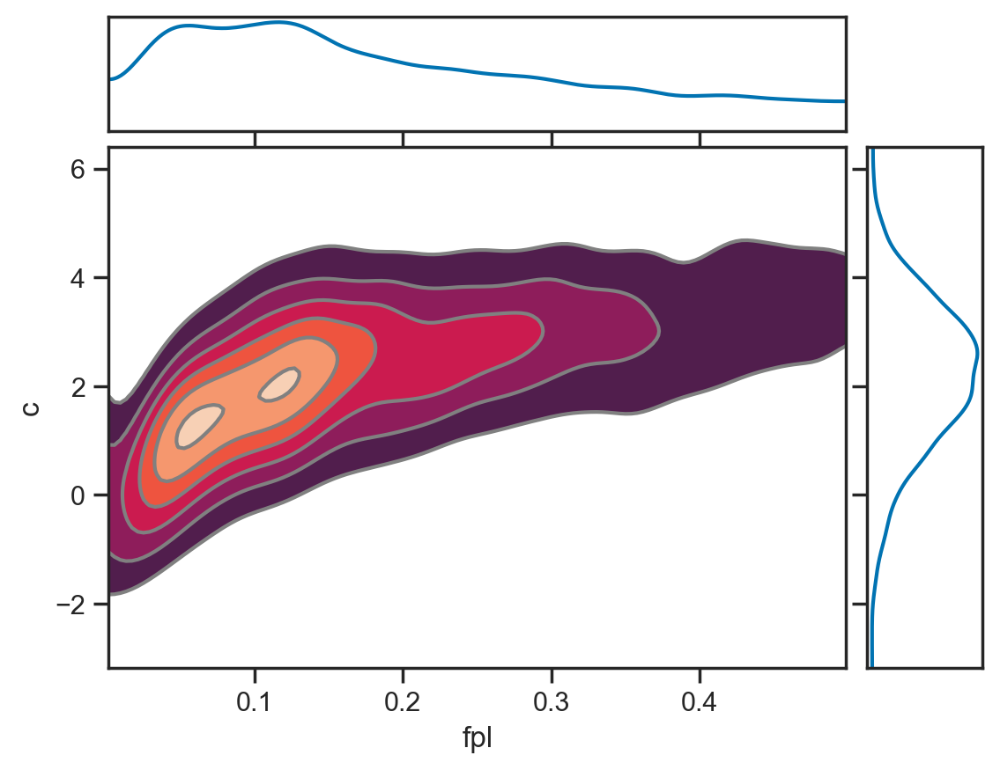

In [76]:
az.plot_pair(trace, var_names=['fpl', 'c'], kind='kde', marginals=True)

In [59]:
m1s_det = m1s * (1 + zs)
dls = Planck18.luminosity_distance(zs).to(u.Gpc).value
pdraws_det = pdraws / (1 + zs) / (Planck18.comoving_distance(zs).to(u.Gpc).value + (1+zs)*Planck18.hubble_distance.to(u.Gpc).value/Planck18.efunc(zs))

m1s_det_sel_cut = m1s_sel_cut * (1 + zs_sel_cut)
dls_sel_cut = Planck18.luminosity_distance(zs_sel_cut).to(u.Gpc).value
pdraw_det_sel_cut = pdraw_sel_cut / (1+zs_sel_cut) / (Planck18.comoving_distance(zs_sel_cut).to(u.Gpc).value + (1+zs_sel_cut)*Planck18.hubble_distance.to(u.Gpc).value/Planck18.efunc(zs_sel_cut))

In [60]:
model_cosmo = make_pop_cosmo_model(m1s_det, qs, dls, pdraws_det, m1s_det_sel_cut, qs_sel_cut, dls_sel_cut, pdraw_det_sel_cut, ndraw_cut)

In [61]:
reload_cosmo = False

if reload_cosmo:
    trace = az.from_netcdf('../src/data/trace_cosmo.nc')
else:
    nmcmc = 1000
    chains = 4
    with tqdm(total=2*nmcmc*chains, smoothing=10/(2*nmcmc*chains)) as bar:
        with model_cosmo:
            trace_cosmo = pm.sample(draws=nmcmc, tune=nmcmc, chains=chains, progressbar=False, init='jitter+adapt_full', callback=lambda draw, trace: bar.update(1))

  0%|          | 0/8000 [00:00<?, ?it/s]

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_full...
/Users/wfarr/miniconda3/envs/BumpCosmology/lib/python3.11/site-packages/pymc/step_methods/hmc/quadpotential.py:629: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [h, Om, w, a, b, c, mpisn, dmbhmax, sigma, beta, log_fpl, lam, dkappa, zp, R]
Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3797 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
There were 390 divergences after tuning. Increase `target_accept` or reparameterize.


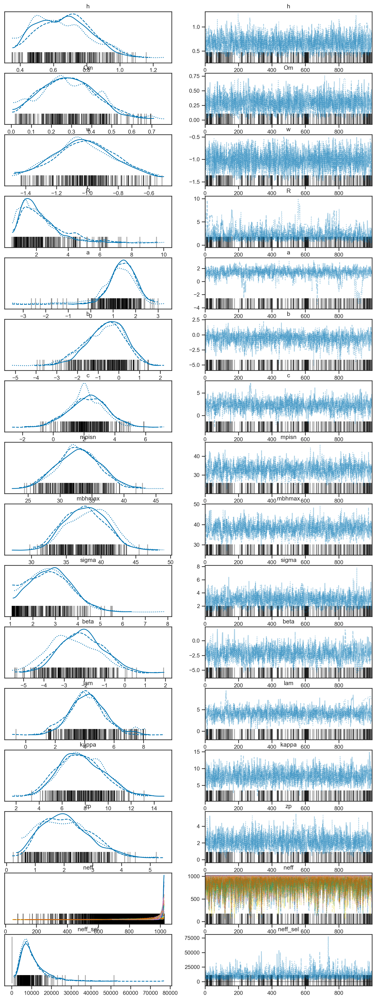

In [62]:
with model_cosmo:
    az.plot_trace(trace_cosmo, coords={'chain': [0,1,3]}, lines=[('neff_sel', {}, 4*m1s.shape[0])],
                  var_names=['h', 'Om', 'w', 'R', 'a', 'b', 'c', 'mpisn', 'mbhmax', 'sigma', 'beta', 'lam', 'kappa', 'zp', 'neff', 'neff_sel'])

In [63]:
if not reload_cosmo:
    az.to_netcdf(trace_cosmo, '../src/data/trace_cosmo.nc')

In [64]:
trace_cosmo.posterior.neff_sel.min()

<xarray.DataArray 'neff_sel' ()>
array(893.28124958)

In [65]:
trace_cosmo.posterior.neff.min(dim=['chain','draw'])

<xarray.DataArray 'neff' (obs: 56)>
array([385.20799877, 818.21884693, 788.35040069, 833.20289159,
       452.44332016, 844.99350236, 608.64974289, 429.93748301,
        95.44219093, 346.47045187,  61.203627  , 125.53686938,
       808.47310125, 776.94331261, 404.71549984, 314.05609134,
       154.00912498,  32.76305301, 887.75324877, 779.7667962 ,
        63.52037845, 698.46053755, 239.15635961, 772.58153643,
       502.65602505, 435.46446314, 338.17408536, 556.34707349,
        17.26116626, 374.19966938, 572.59450152, 354.12259778,
       433.12381517, 502.15431369, 247.4898015 , 357.71082317,
       242.16734611, 214.77492318, 237.95160659, 575.55235094,
       853.11866292, 459.65582891, 847.88408406, 377.02752906,
       772.31560007, 946.08651576, 864.1760371 , 820.29454386,
       478.59236261, 427.99883176, 961.08612238, 426.00775155,
       251.97336092,  34.30031345, 938.22204729, 689.05312378])
Coordinates:
  * obs      (obs) int64 0 1 2 3 4 5 6 7 8 9 ... 46 47 48 49 50 51 52 53 54 55

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{q=1, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

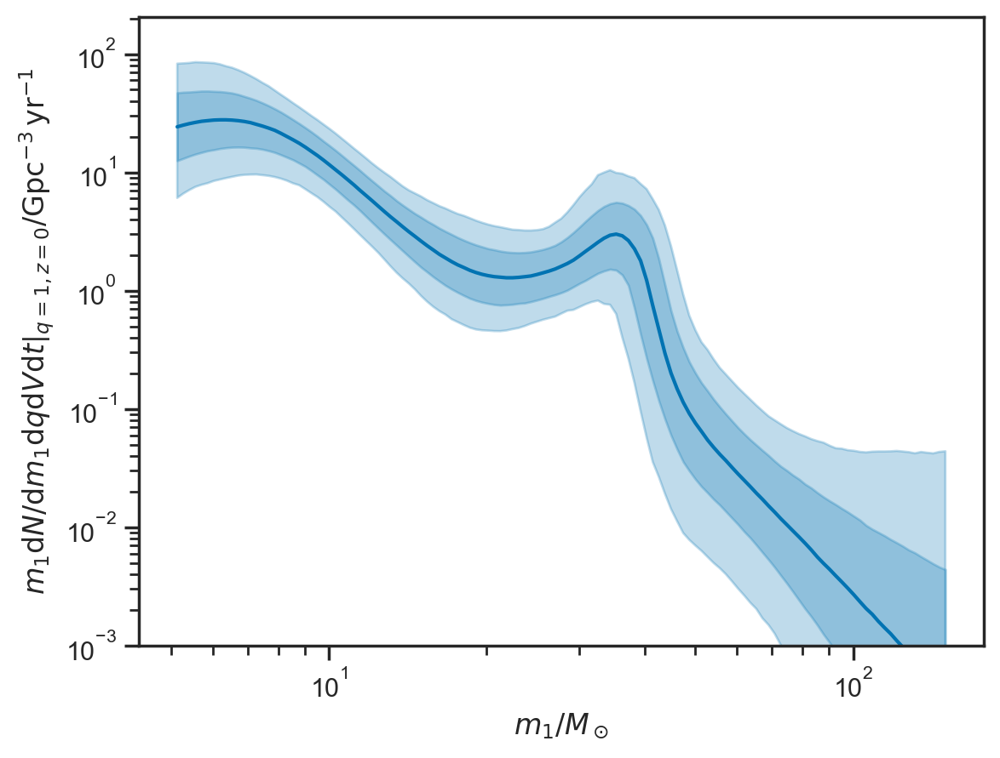

In [67]:
d = ['chain', 'draw']
m = trace_cosmo.posterior.coords['m_grid']
dN = trace_cosmo.posterior['mdNdmdVdt_fixed_qz']
l, = plt.plot(m[1:], dN.median(dim=d)[1:])
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(m[1:], dN.quantile(h, dim=d)[1:], dN.quantile(l, dim=d)[1:], color=c, alpha=0.25)
plt.xscale('log')
plt.yscale('log')
plt.ylim(bottom=1e-3)
plt.xlabel(r'$m_1 / M_\odot$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{q=1, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, z=0} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

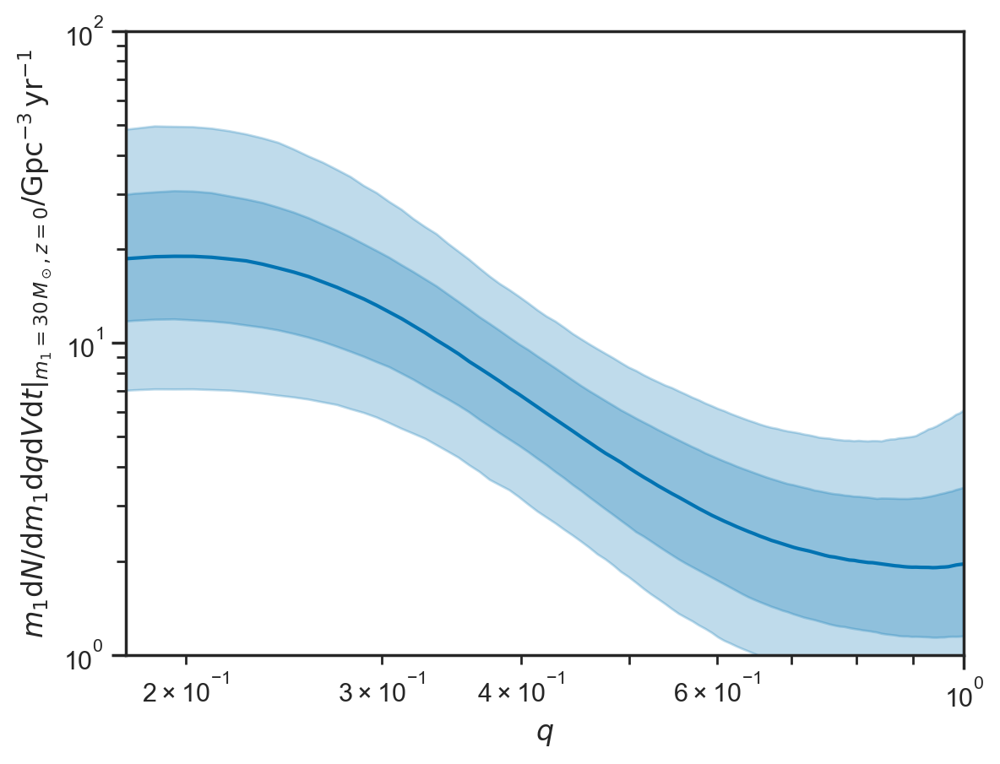

In [70]:
d = ['chain', 'draw']
q = trace_cosmo.posterior.coords['q_grid']
dN = trace_cosmo.posterior['dNdqdVdt_fixed_mz']
l, = plt.plot(q, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(q, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.xscale('log')
plt.yscale('log')
plt.xlim(left=5/30+0.01, right=1)
plt.ylim(bottom=1e0, top=1e2)
plt.xlabel(r'$q$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, z=0} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$\\left. m_1 \\mathrm{d} N/\\mathrm{d} m_1 \\mathrm{d} q \\mathrm{d} V \\mathrm{d} t \\right|_{m_1=30\\,M_\\odot, q=1} / \\mathrm{Gpc}^{-3} \\, \\mathrm{yr}^{-1}$')

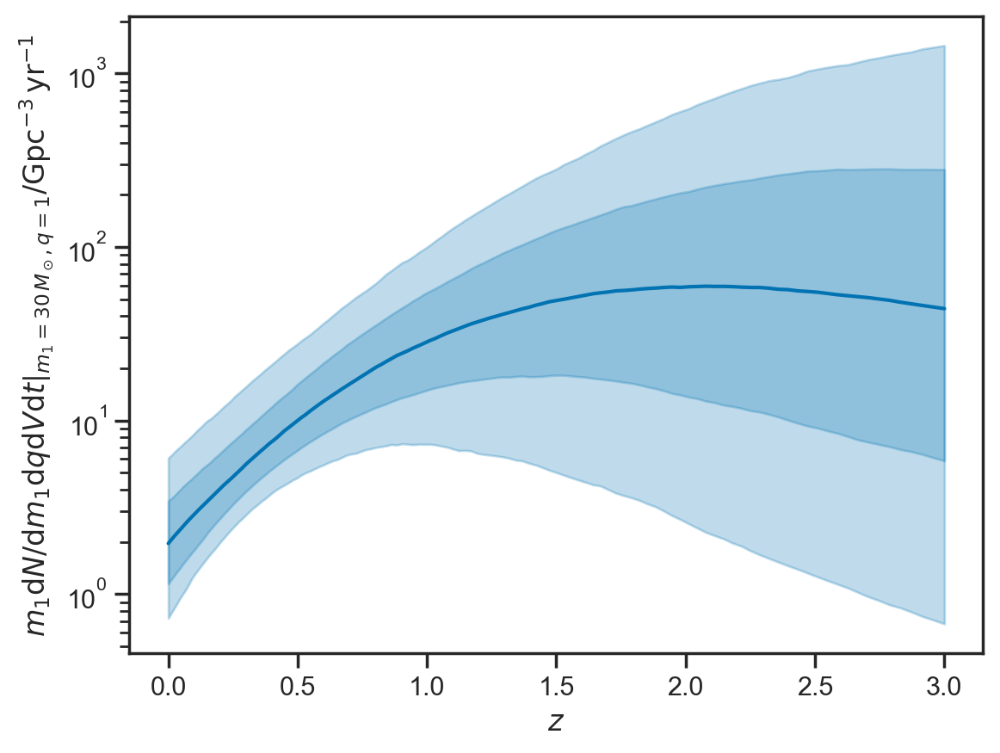

In [71]:
d = ['chain', 'draw']
z = trace_cosmo.posterior.coords['z_grid']
dN = trace_cosmo.posterior['dNdVdt_fixed_mq']
l, = plt.plot(z, dN.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(z, dN.quantile(h, dim=d), dN.quantile(l, dim=d), color=c, alpha=0.25)
plt.yscale('log')
plt.xlabel(r'$z$')
plt.ylabel(r'$\left. m_1 \mathrm{d} N/\mathrm{d} m_1 \mathrm{d} q \mathrm{d} V \mathrm{d} t \right|_{m_1=30\,M_\odot, q=1} / \mathrm{Gpc}^{-3} \, \mathrm{yr}^{-1}$')

Text(0, 0.5, '$h(z)$')

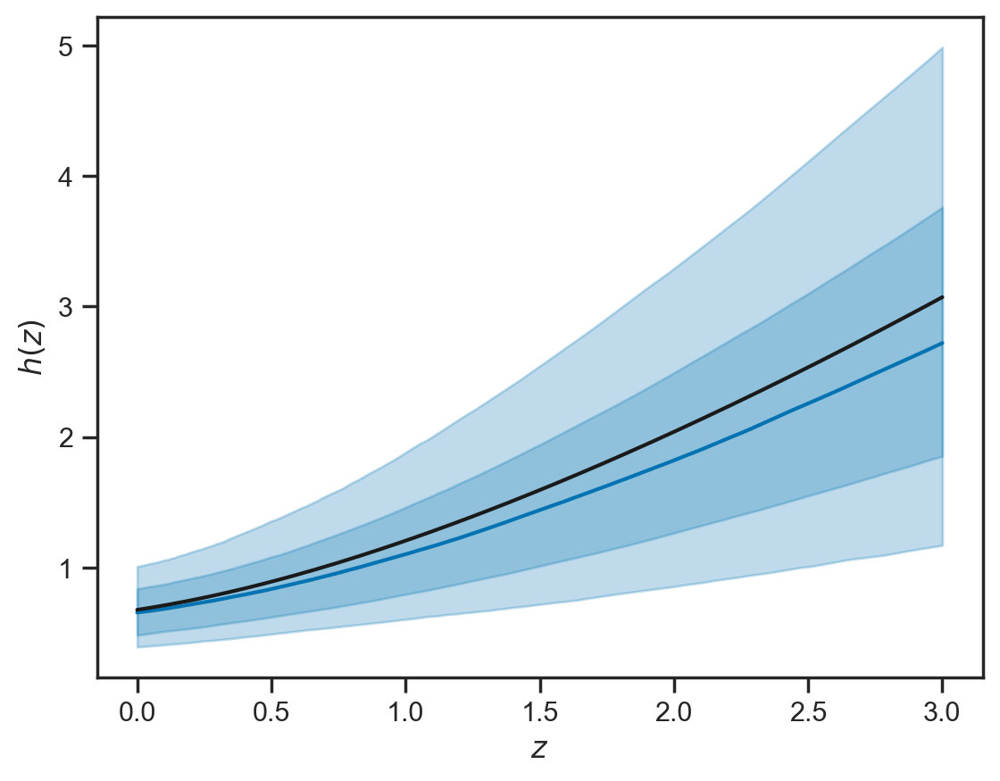

In [72]:
d = ['chain', 'draw']
z = trace_cosmo.posterior.coords['z_grid']
hz = trace_cosmo.posterior.hz
l, = plt.plot(z, hz.median(dim=d))
c = l.get_color()
for (l,h) in [(0.16, 0.84), (0.025, 0.975)]:
    plt.fill_between(z, hz.quantile(h, dim=d), hz.quantile(l, dim=d), color=c, alpha=0.25)
plt.plot(z, Planck18.h*Planck18.efunc(z), color='k')
plt.xlabel(r'$z$')
plt.ylabel(r'$h(z)$')


array([[<Axes: ylabel='Om'>, <Axes: >],
       [<Axes: xlabel='h', ylabel='w'>, <Axes: xlabel='Om'>]],
      dtype=object)

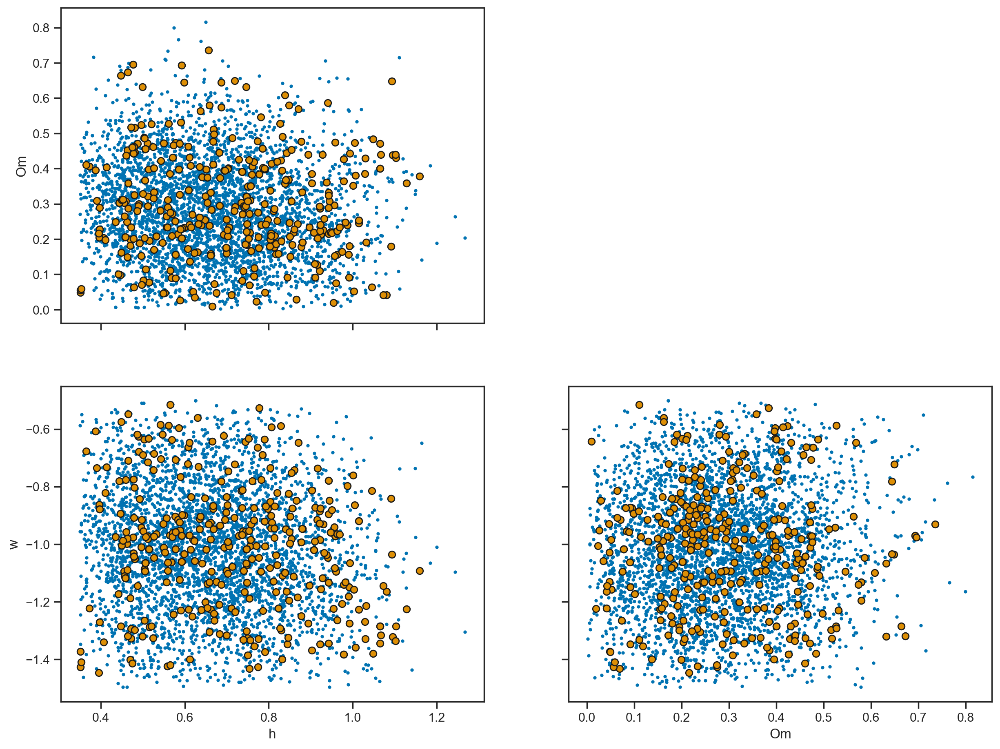

In [89]:
az.plot_pair(trace_cosmo, var_names=['h', 'Om', 'w'], divergences=True)

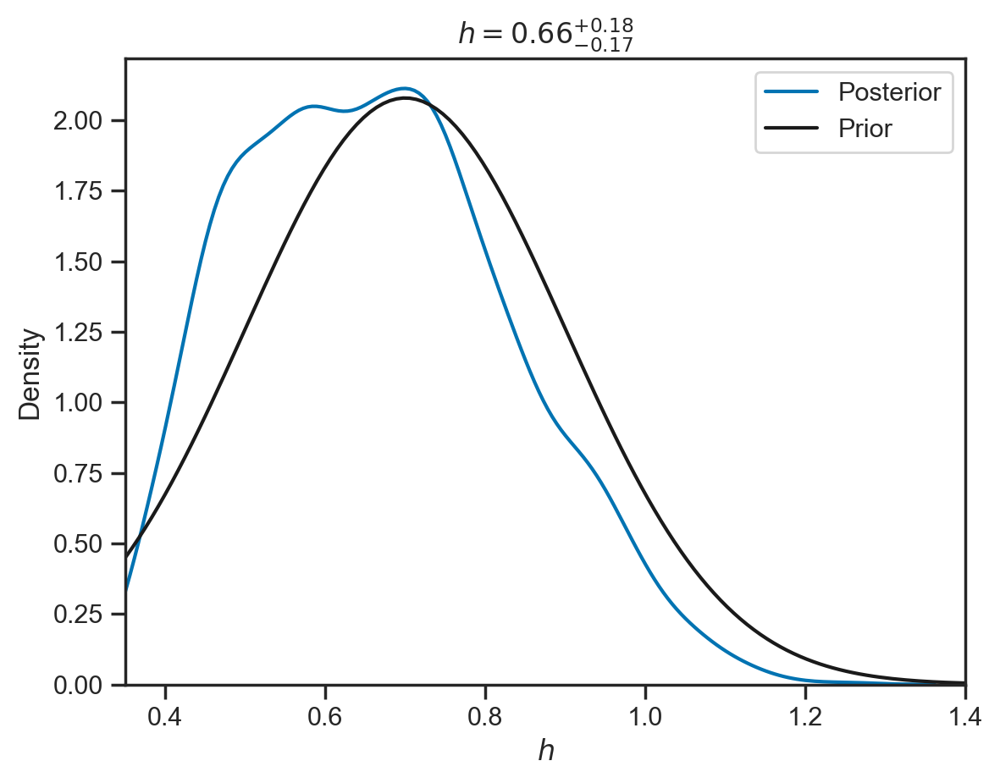

In [79]:
sns.kdeplot(trace_cosmo.posterior.h.values.flatten(), label='Posterior')
hs = np.linspace(0.35, 1.4, 128)
d = ss.norm(loc=0.7, scale=0.2)
plt.plot(hs, d.pdf(hs)/(d.cdf(1.4)-d.cdf(0.35)), color='k', label='Prior')
hs = trace_cosmo.posterior.h
m = hs.median()
h = hs.quantile(0.84)
l = hs.quantile(0.16)
plt.xlim(0.35, 1.4)
plt.title(r'$h = {:.2f}^{{+{:.2f}}}_{{-{:.2f}}}$'.format(m, h-m, m-l))
plt.xlabel(r'$h$')
plt.legend()

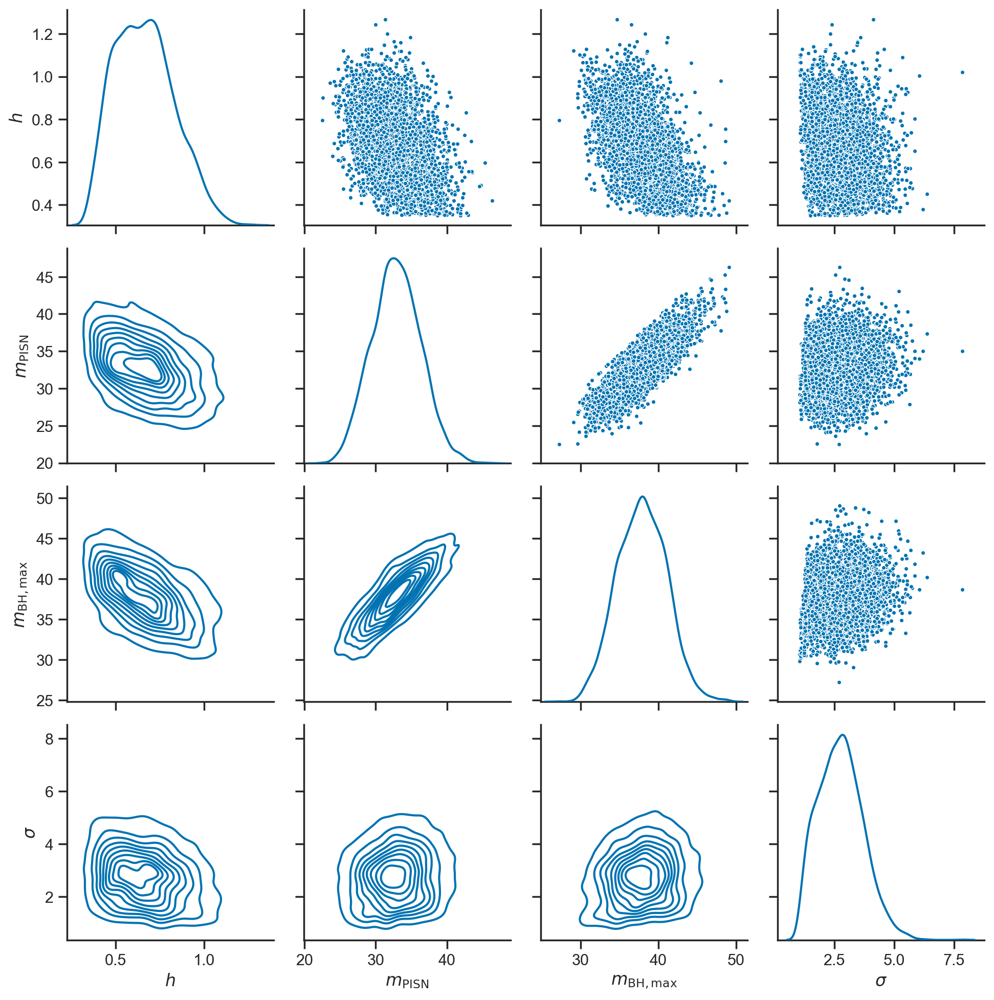

In [88]:
col_label_dict = {
    'h': '$h$',
    'mpisn': '$m_{\mathrm{PISN}}$',
    'mbhmax': '$m_{\mathrm{BH,max}}$',
    'sigma': '$\sigma$'
}
pg = sns.PairGrid(pd.DataFrame({col_label_dict[k]: trace_cosmo.posterior[k].values.flatten() for k in ['h', 'mpisn', 'mbhmax', 'sigma']}), diag_sharey=False)
pg.map_diag(sns.kdeplot)
pg.map_lower(sns.kdeplot)
pg.map_upper(sns.scatterplot, marker='.')